In [1]:
import os, glob
import shutil
import tempfile

import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm

from monai.losses import DiceCELoss
from monai.inferers import sliding_window_inference
from monai.transforms import (
    AsDiscrete,
    AddChanneld,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    ScaleIntensityRanged,
    Spacingd,
    ToTensord,
    Resized,
    RandCropByPosNegLabeld,
)

from monai.config import print_config
from monai.metrics import DiceMetric
from monai.networks.nets import UNETR

from monai.data import (
    DataLoader,
    CacheDataset,
    load_decathlon_datalist,
    decollate_batch,
)


import torch

%matplotlib inline

print_config()

MONAI version: 0.9.dev2223
Numpy version: 1.22.3
Pytorch version: 1.11.0
MONAI flags: HAS_EXT = False, USE_COMPILED = False
MONAI rev id: 0428f5a29f1fdc577f2c558490266d9db00583e3
MONAI __file__: /home/trojan/anaconda3/envs/monai/lib/python3.10/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: NOT INSTALLED or UNKNOWN VERSION.
Nibabel version: 3.2.2
scikit-image version: 0.19.2
Pillow version: 9.0.1
Tensorboard version: NOT INSTALLED or UNKNOWN VERSION.
gdown version: NOT INSTALLED or UNKNOWN VERSION.
TorchVision version: 0.12.0
tqdm version: 4.64.0
lmdb version: NOT INSTALLED or UNKNOWN VERSION.
psutil version: 5.9.1
pandas version: 1.4.2
einops version: 0.4.1
transformers version: NOT INSTALLED or UNKNOWN VERSION.
mlflow version: NOT INSTALLED or UNKNOWN VERSION.
pynrrd version: 0.4.3

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



In [2]:
root_dir = os.path.join(os.getcwd(), "monai_data_directory")
INPUT_SIZE = (128,128,64)
print(root_dir)

/home/trojan/skia_projects/3D-CT-Artery-Segmentation/monai/monai_data_directory


# Define and load model

In [3]:
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UNETR(
    in_channels=1,
    out_channels=3,
    img_size=INPUT_SIZE,
    feature_size=16,
    hidden_size=768,
    mlp_dim=3072,
    num_heads=12,
    pos_embed="perceptron",
    norm_name="instance",
    res_block=True,
    dropout_rate=0.0,
).to(device)

In [4]:
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))
model.eval()

RuntimeError: Error(s) in loading state_dict for UNETR:
	Missing key(s) in state_dict: "vit.patch_embedding.position_embeddings", "vit.patch_embedding.patch_embeddings.1.weight", "vit.patch_embedding.patch_embeddings.1.bias", "vit.blocks.0.mlp.linear1.weight", "vit.blocks.0.mlp.linear1.bias", "vit.blocks.0.mlp.linear2.weight", "vit.blocks.0.mlp.linear2.bias", "vit.blocks.0.norm1.weight", "vit.blocks.0.norm1.bias", "vit.blocks.0.attn.out_proj.weight", "vit.blocks.0.attn.out_proj.bias", "vit.blocks.0.attn.qkv.weight", "vit.blocks.0.norm2.weight", "vit.blocks.0.norm2.bias", "vit.blocks.1.mlp.linear1.weight", "vit.blocks.1.mlp.linear1.bias", "vit.blocks.1.mlp.linear2.weight", "vit.blocks.1.mlp.linear2.bias", "vit.blocks.1.norm1.weight", "vit.blocks.1.norm1.bias", "vit.blocks.1.attn.out_proj.weight", "vit.blocks.1.attn.out_proj.bias", "vit.blocks.1.attn.qkv.weight", "vit.blocks.1.norm2.weight", "vit.blocks.1.norm2.bias", "vit.blocks.2.mlp.linear1.weight", "vit.blocks.2.mlp.linear1.bias", "vit.blocks.2.mlp.linear2.weight", "vit.blocks.2.mlp.linear2.bias", "vit.blocks.2.norm1.weight", "vit.blocks.2.norm1.bias", "vit.blocks.2.attn.out_proj.weight", "vit.blocks.2.attn.out_proj.bias", "vit.blocks.2.attn.qkv.weight", "vit.blocks.2.norm2.weight", "vit.blocks.2.norm2.bias", "vit.blocks.3.mlp.linear1.weight", "vit.blocks.3.mlp.linear1.bias", "vit.blocks.3.mlp.linear2.weight", "vit.blocks.3.mlp.linear2.bias", "vit.blocks.3.norm1.weight", "vit.blocks.3.norm1.bias", "vit.blocks.3.attn.out_proj.weight", "vit.blocks.3.attn.out_proj.bias", "vit.blocks.3.attn.qkv.weight", "vit.blocks.3.norm2.weight", "vit.blocks.3.norm2.bias", "vit.blocks.4.mlp.linear1.weight", "vit.blocks.4.mlp.linear1.bias", "vit.blocks.4.mlp.linear2.weight", "vit.blocks.4.mlp.linear2.bias", "vit.blocks.4.norm1.weight", "vit.blocks.4.norm1.bias", "vit.blocks.4.attn.out_proj.weight", "vit.blocks.4.attn.out_proj.bias", "vit.blocks.4.attn.qkv.weight", "vit.blocks.4.norm2.weight", "vit.blocks.4.norm2.bias", "vit.blocks.5.mlp.linear1.weight", "vit.blocks.5.mlp.linear1.bias", "vit.blocks.5.mlp.linear2.weight", "vit.blocks.5.mlp.linear2.bias", "vit.blocks.5.norm1.weight", "vit.blocks.5.norm1.bias", "vit.blocks.5.attn.out_proj.weight", "vit.blocks.5.attn.out_proj.bias", "vit.blocks.5.attn.qkv.weight", "vit.blocks.5.norm2.weight", "vit.blocks.5.norm2.bias", "vit.blocks.6.mlp.linear1.weight", "vit.blocks.6.mlp.linear1.bias", "vit.blocks.6.mlp.linear2.weight", "vit.blocks.6.mlp.linear2.bias", "vit.blocks.6.norm1.weight", "vit.blocks.6.norm1.bias", "vit.blocks.6.attn.out_proj.weight", "vit.blocks.6.attn.out_proj.bias", "vit.blocks.6.attn.qkv.weight", "vit.blocks.6.norm2.weight", "vit.blocks.6.norm2.bias", "vit.blocks.7.mlp.linear1.weight", "vit.blocks.7.mlp.linear1.bias", "vit.blocks.7.mlp.linear2.weight", "vit.blocks.7.mlp.linear2.bias", "vit.blocks.7.norm1.weight", "vit.blocks.7.norm1.bias", "vit.blocks.7.attn.out_proj.weight", "vit.blocks.7.attn.out_proj.bias", "vit.blocks.7.attn.qkv.weight", "vit.blocks.7.norm2.weight", "vit.blocks.7.norm2.bias", "vit.blocks.8.mlp.linear1.weight", "vit.blocks.8.mlp.linear1.bias", "vit.blocks.8.mlp.linear2.weight", "vit.blocks.8.mlp.linear2.bias", "vit.blocks.8.norm1.weight", "vit.blocks.8.norm1.bias", "vit.blocks.8.attn.out_proj.weight", "vit.blocks.8.attn.out_proj.bias", "vit.blocks.8.attn.qkv.weight", "vit.blocks.8.norm2.weight", "vit.blocks.8.norm2.bias", "vit.blocks.9.mlp.linear1.weight", "vit.blocks.9.mlp.linear1.bias", "vit.blocks.9.mlp.linear2.weight", "vit.blocks.9.mlp.linear2.bias", "vit.blocks.9.norm1.weight", "vit.blocks.9.norm1.bias", "vit.blocks.9.attn.out_proj.weight", "vit.blocks.9.attn.out_proj.bias", "vit.blocks.9.attn.qkv.weight", "vit.blocks.9.norm2.weight", "vit.blocks.9.norm2.bias", "vit.blocks.10.mlp.linear1.weight", "vit.blocks.10.mlp.linear1.bias", "vit.blocks.10.mlp.linear2.weight", "vit.blocks.10.mlp.linear2.bias", "vit.blocks.10.norm1.weight", "vit.blocks.10.norm1.bias", "vit.blocks.10.attn.out_proj.weight", "vit.blocks.10.attn.out_proj.bias", "vit.blocks.10.attn.qkv.weight", "vit.blocks.10.norm2.weight", "vit.blocks.10.norm2.bias", "vit.blocks.11.mlp.linear1.weight", "vit.blocks.11.mlp.linear1.bias", "vit.blocks.11.mlp.linear2.weight", "vit.blocks.11.mlp.linear2.bias", "vit.blocks.11.norm1.weight", "vit.blocks.11.norm1.bias", "vit.blocks.11.attn.out_proj.weight", "vit.blocks.11.attn.out_proj.bias", "vit.blocks.11.attn.qkv.weight", "vit.blocks.11.norm2.weight", "vit.blocks.11.norm2.bias", "vit.norm.weight", "vit.norm.bias", "encoder1.layer.conv1.conv.weight", "encoder1.layer.conv2.conv.weight", "encoder1.layer.conv3.conv.weight", "encoder2.transp_conv_init.conv.weight", "encoder2.blocks.0.0.conv.weight", "encoder2.blocks.0.1.conv1.conv.weight", "encoder2.blocks.0.1.conv2.conv.weight", "encoder2.blocks.1.0.conv.weight", "encoder2.blocks.1.1.conv1.conv.weight", "encoder2.blocks.1.1.conv2.conv.weight", "encoder3.transp_conv_init.conv.weight", "encoder3.blocks.0.0.conv.weight", "encoder3.blocks.0.1.conv1.conv.weight", "encoder3.blocks.0.1.conv2.conv.weight", "encoder4.transp_conv_init.conv.weight", "decoder5.transp_conv.conv.weight", "decoder5.conv_block.conv1.conv.weight", "decoder5.conv_block.conv2.conv.weight", "decoder5.conv_block.conv3.conv.weight", "decoder4.transp_conv.conv.weight", "decoder4.conv_block.conv1.conv.weight", "decoder4.conv_block.conv2.conv.weight", "decoder4.conv_block.conv3.conv.weight", "decoder3.transp_conv.conv.weight", "decoder3.conv_block.conv1.conv.weight", "decoder3.conv_block.conv2.conv.weight", "decoder3.conv_block.conv3.conv.weight", "decoder2.transp_conv.conv.weight", "decoder2.conv_block.conv1.conv.weight", "decoder2.conv_block.conv2.conv.weight", "decoder2.conv_block.conv3.conv.weight", "out.conv.conv.weight", "out.conv.conv.bias". 
	Unexpected key(s) in state_dict: "model.0.conv.unit0.conv.weight", "model.0.conv.unit0.conv.bias", "model.0.conv.unit0.adn.N.weight", "model.0.conv.unit0.adn.N.bias", "model.0.conv.unit0.adn.N.running_mean", "model.0.conv.unit0.adn.N.running_var", "model.0.conv.unit0.adn.N.num_batches_tracked", "model.0.conv.unit0.adn.A.weight", "model.0.conv.unit1.conv.weight", "model.0.conv.unit1.conv.bias", "model.0.conv.unit1.adn.N.weight", "model.0.conv.unit1.adn.N.bias", "model.0.conv.unit1.adn.N.running_mean", "model.0.conv.unit1.adn.N.running_var", "model.0.conv.unit1.adn.N.num_batches_tracked", "model.0.conv.unit1.adn.A.weight", "model.0.residual.weight", "model.0.residual.bias", "model.1.submodule.0.conv.unit0.conv.weight", "model.1.submodule.0.conv.unit0.conv.bias", "model.1.submodule.0.conv.unit0.adn.N.weight", "model.1.submodule.0.conv.unit0.adn.N.bias", "model.1.submodule.0.conv.unit0.adn.N.running_mean", "model.1.submodule.0.conv.unit0.adn.N.running_var", "model.1.submodule.0.conv.unit0.adn.N.num_batches_tracked", "model.1.submodule.0.conv.unit0.adn.A.weight", "model.1.submodule.0.conv.unit1.conv.weight", "model.1.submodule.0.conv.unit1.conv.bias", "model.1.submodule.0.conv.unit1.adn.N.weight", "model.1.submodule.0.conv.unit1.adn.N.bias", "model.1.submodule.0.conv.unit1.adn.N.running_mean", "model.1.submodule.0.conv.unit1.adn.N.running_var", "model.1.submodule.0.conv.unit1.adn.N.num_batches_tracked", "model.1.submodule.0.conv.unit1.adn.A.weight", "model.1.submodule.0.residual.weight", "model.1.submodule.0.residual.bias", "model.1.submodule.1.submodule.0.conv.unit0.conv.weight", "model.1.submodule.1.submodule.0.conv.unit0.conv.bias", "model.1.submodule.1.submodule.0.conv.unit0.adn.N.weight", "model.1.submodule.1.submodule.0.conv.unit0.adn.N.bias", "model.1.submodule.1.submodule.0.conv.unit0.adn.N.running_mean", "model.1.submodule.1.submodule.0.conv.unit0.adn.N.running_var", "model.1.submodule.1.submodule.0.conv.unit0.adn.N.num_batches_tracked", "model.1.submodule.1.submodule.0.conv.unit0.adn.A.weight", "model.1.submodule.1.submodule.0.conv.unit1.conv.weight", "model.1.submodule.1.submodule.0.conv.unit1.conv.bias", "model.1.submodule.1.submodule.0.conv.unit1.adn.N.weight", "model.1.submodule.1.submodule.0.conv.unit1.adn.N.bias", "model.1.submodule.1.submodule.0.conv.unit1.adn.N.running_mean", "model.1.submodule.1.submodule.0.conv.unit1.adn.N.running_var", "model.1.submodule.1.submodule.0.conv.unit1.adn.N.num_batches_tracked", "model.1.submodule.1.submodule.0.conv.unit1.adn.A.weight", "model.1.submodule.1.submodule.0.residual.weight", "model.1.submodule.1.submodule.0.residual.bias", "model.1.submodule.1.submodule.1.submodule.0.conv.unit0.conv.weight", "model.1.submodule.1.submodule.1.submodule.0.conv.unit0.conv.bias", "model.1.submodule.1.submodule.1.submodule.0.conv.unit0.adn.N.weight", "model.1.submodule.1.submodule.1.submodule.0.conv.unit0.adn.N.bias", "model.1.submodule.1.submodule.1.submodule.0.conv.unit0.adn.N.running_mean", "model.1.submodule.1.submodule.1.submodule.0.conv.unit0.adn.N.running_var", "model.1.submodule.1.submodule.1.submodule.0.conv.unit0.adn.N.num_batches_tracked", "model.1.submodule.1.submodule.1.submodule.0.conv.unit0.adn.A.weight", "model.1.submodule.1.submodule.1.submodule.0.conv.unit1.conv.weight", "model.1.submodule.1.submodule.1.submodule.0.conv.unit1.conv.bias", "model.1.submodule.1.submodule.1.submodule.0.conv.unit1.adn.N.weight", "model.1.submodule.1.submodule.1.submodule.0.conv.unit1.adn.N.bias", "model.1.submodule.1.submodule.1.submodule.0.conv.unit1.adn.N.running_mean", "model.1.submodule.1.submodule.1.submodule.0.conv.unit1.adn.N.running_var", "model.1.submodule.1.submodule.1.submodule.0.conv.unit1.adn.N.num_batches_tracked", "model.1.submodule.1.submodule.1.submodule.0.conv.unit1.adn.A.weight", "model.1.submodule.1.submodule.1.submodule.0.residual.weight", "model.1.submodule.1.submodule.1.submodule.0.residual.bias", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit0.conv.weight", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit0.conv.bias", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit0.adn.N.weight", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit0.adn.N.bias", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit0.adn.N.running_mean", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit0.adn.N.running_var", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit0.adn.N.num_batches_tracked", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit0.adn.A.weight", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit1.conv.weight", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit1.conv.bias", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit1.adn.N.weight", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit1.adn.N.bias", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit1.adn.N.running_mean", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit1.adn.N.running_var", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit1.adn.N.num_batches_tracked", "model.1.submodule.1.submodule.1.submodule.1.submodule.conv.unit1.adn.A.weight", "model.1.submodule.1.submodule.1.submodule.1.submodule.residual.weight", "model.1.submodule.1.submodule.1.submodule.1.submodule.residual.bias", "model.1.submodule.1.submodule.1.submodule.2.0.conv.weight", "model.1.submodule.1.submodule.1.submodule.2.0.conv.bias", "model.1.submodule.1.submodule.1.submodule.2.0.adn.N.weight", "model.1.submodule.1.submodule.1.submodule.2.0.adn.N.bias", "model.1.submodule.1.submodule.1.submodule.2.0.adn.N.running_mean", "model.1.submodule.1.submodule.1.submodule.2.0.adn.N.running_var", "model.1.submodule.1.submodule.1.submodule.2.0.adn.N.num_batches_tracked", "model.1.submodule.1.submodule.1.submodule.2.0.adn.A.weight", "model.1.submodule.1.submodule.1.submodule.2.1.conv.unit0.conv.weight", "model.1.submodule.1.submodule.1.submodule.2.1.conv.unit0.conv.bias", "model.1.submodule.1.submodule.1.submodule.2.1.conv.unit0.adn.N.weight", "model.1.submodule.1.submodule.1.submodule.2.1.conv.unit0.adn.N.bias", "model.1.submodule.1.submodule.1.submodule.2.1.conv.unit0.adn.N.running_mean", "model.1.submodule.1.submodule.1.submodule.2.1.conv.unit0.adn.N.running_var", "model.1.submodule.1.submodule.1.submodule.2.1.conv.unit0.adn.N.num_batches_tracked", "model.1.submodule.1.submodule.1.submodule.2.1.conv.unit0.adn.A.weight", "model.1.submodule.1.submodule.2.0.conv.weight", "model.1.submodule.1.submodule.2.0.conv.bias", "model.1.submodule.1.submodule.2.0.adn.N.weight", "model.1.submodule.1.submodule.2.0.adn.N.bias", "model.1.submodule.1.submodule.2.0.adn.N.running_mean", "model.1.submodule.1.submodule.2.0.adn.N.running_var", "model.1.submodule.1.submodule.2.0.adn.N.num_batches_tracked", "model.1.submodule.1.submodule.2.0.adn.A.weight", "model.1.submodule.1.submodule.2.1.conv.unit0.conv.weight", "model.1.submodule.1.submodule.2.1.conv.unit0.conv.bias", "model.1.submodule.1.submodule.2.1.conv.unit0.adn.N.weight", "model.1.submodule.1.submodule.2.1.conv.unit0.adn.N.bias", "model.1.submodule.1.submodule.2.1.conv.unit0.adn.N.running_mean", "model.1.submodule.1.submodule.2.1.conv.unit0.adn.N.running_var", "model.1.submodule.1.submodule.2.1.conv.unit0.adn.N.num_batches_tracked", "model.1.submodule.1.submodule.2.1.conv.unit0.adn.A.weight", "model.1.submodule.2.0.conv.weight", "model.1.submodule.2.0.conv.bias", "model.1.submodule.2.0.adn.N.weight", "model.1.submodule.2.0.adn.N.bias", "model.1.submodule.2.0.adn.N.running_mean", "model.1.submodule.2.0.adn.N.running_var", "model.1.submodule.2.0.adn.N.num_batches_tracked", "model.1.submodule.2.0.adn.A.weight", "model.1.submodule.2.1.conv.unit0.conv.weight", "model.1.submodule.2.1.conv.unit0.conv.bias", "model.1.submodule.2.1.conv.unit0.adn.N.weight", "model.1.submodule.2.1.conv.unit0.adn.N.bias", "model.1.submodule.2.1.conv.unit0.adn.N.running_mean", "model.1.submodule.2.1.conv.unit0.adn.N.running_var", "model.1.submodule.2.1.conv.unit0.adn.N.num_batches_tracked", "model.1.submodule.2.1.conv.unit0.adn.A.weight", "model.2.0.conv.weight", "model.2.0.conv.bias", "model.2.0.adn.N.weight", "model.2.0.adn.N.bias", "model.2.0.adn.N.running_mean", "model.2.0.adn.N.running_var", "model.2.0.adn.N.num_batches_tracked", "model.2.0.adn.A.weight", "model.2.1.conv.unit0.conv.weight", "model.2.1.conv.unit0.conv.bias". 

# Predict on validation data

In [14]:
val_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        AddChanneld(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.0, 1.0, 1.0),
            mode=("bilinear", "nearest"),
        ),
        ScaleIntensityRanged(
            keys=["image"], a_min=-175, a_max=250, b_min=0.0, b_max=1.0, clip=True
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Resized(keys=['image', 'label'], spatial_size=INPUT_SIZE, mode='nearest-exact'),
        ToTensord(keys=["image", "label"]),
    ]
)

In [15]:
data_dir = '/media/trojan/evo/3D-CT-Artery-Segmentation/data/data_128x128x64/data_64_groups'
val_images_path = os.path.join(data_dir, 'val/images')
val_labels_path = os.path.join(data_dir, 'val/labels')

val_images_list = sorted(glob.glob(val_images_path + '/*.nii.gz'))
val_labels_list = sorted(glob.glob(val_labels_path + '/*.nii.gz'))

val_files = [{'image': image_name, 'label': label_name} for image_name,label_name in zip(val_images_list, val_labels_list)]

In [16]:
val_ds = CacheDataset(
    data=val_files, transform=val_transforms, cache_num=1, cache_rate=1.0
)
val_loader = DataLoader(
    val_ds, batch_size=1, shuffle=False, pin_memory=True
)

Loading dataset: 100%|██████████████████████████| 10/10 [00:00<00:00, 20.38it/s]


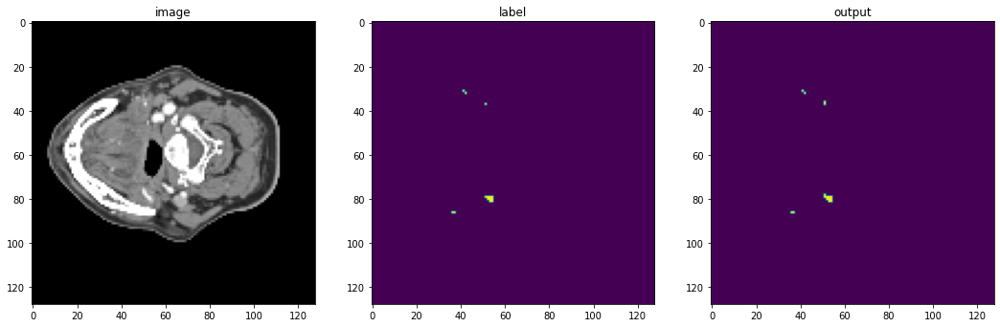

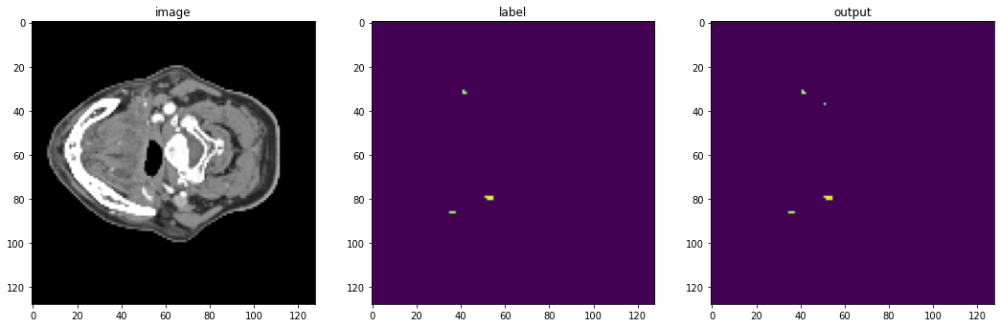

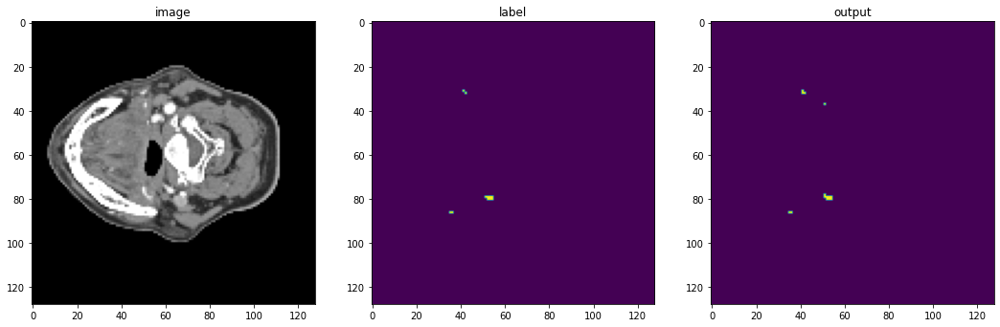

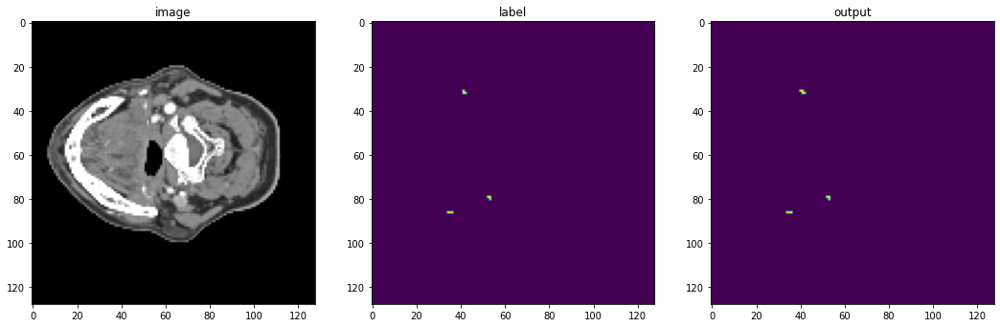

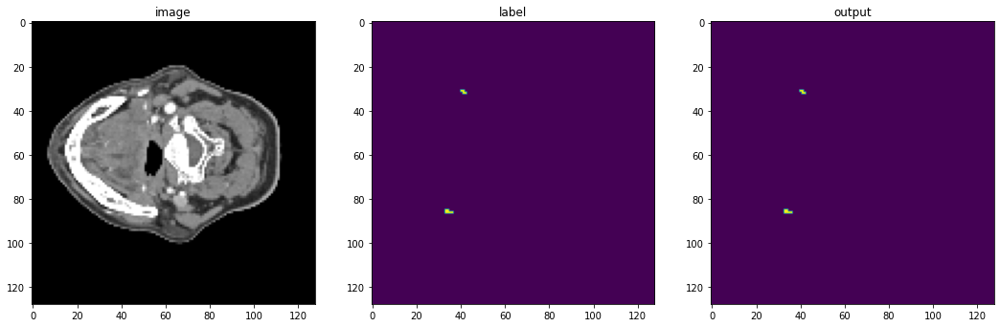

...

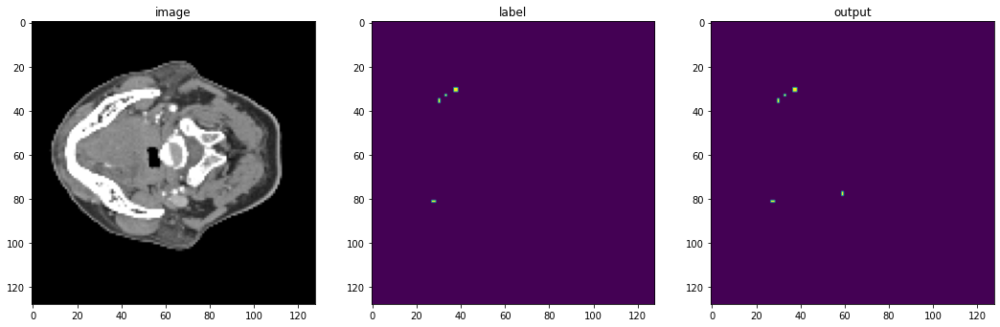

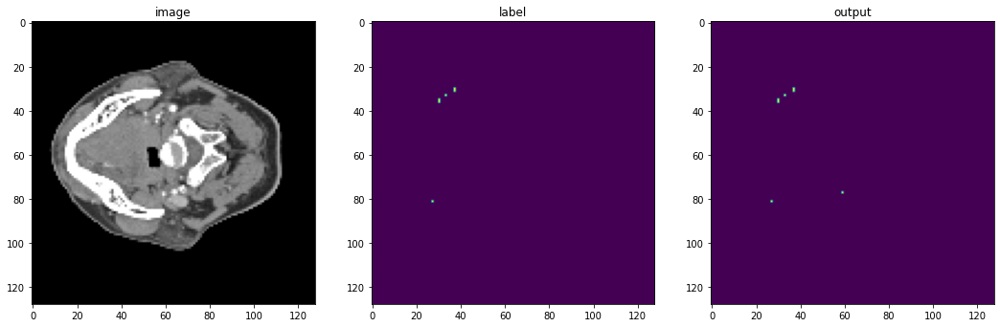

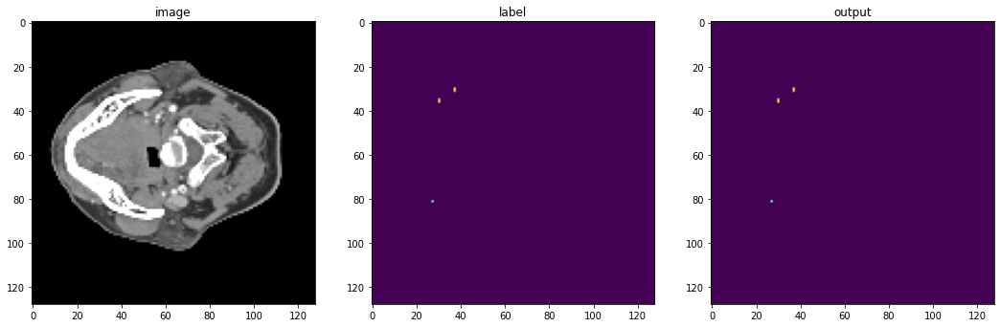

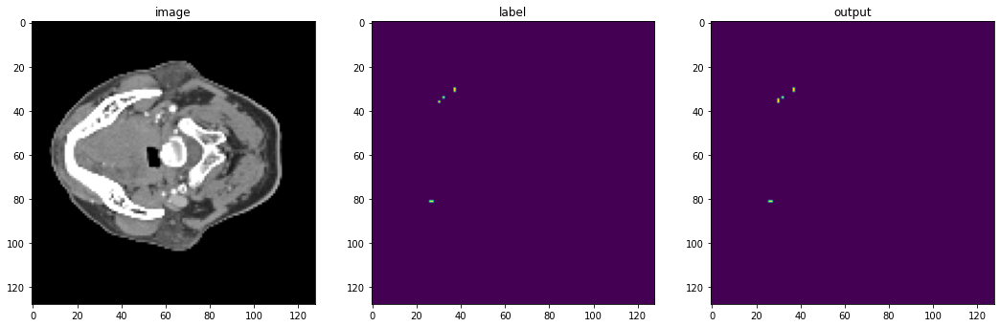

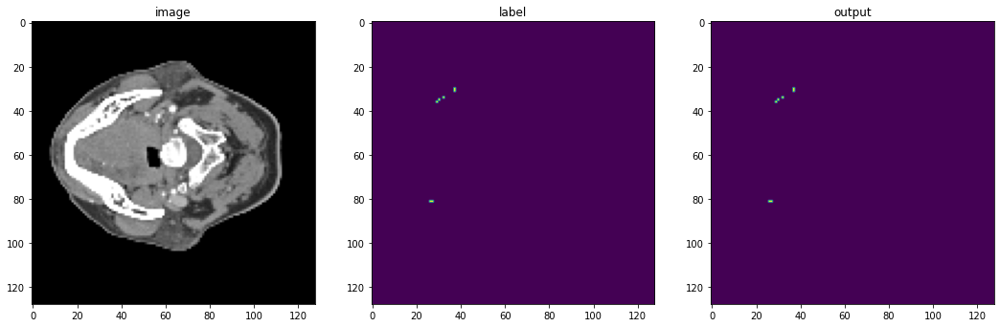

In [17]:
case_num = 6

with torch.no_grad():
    data = val_ds[case_num]
    img = val_ds[case_num]["image"]
    label = val_ds[case_num]["label"]
    val_inputs = torch.unsqueeze(img, 1).cuda()
    val_labels = torch.unsqueeze(label, 1).cuda()
    val_outputs = sliding_window_inference(
        val_inputs, INPUT_SIZE, 4, model, overlap=0.8
    )
#     sigmoid_activation = Activations(softmax=True)
#     val_outputs = sigmoid_activation(val_outputs)
    
    for i in range(0, 32):
        plt.figure("check", (18, 6))
        plt.subplot(1, 3, 1)
        plt.title("image")
        plt.imshow(val_inputs.cpu().numpy()[0, 0, :, :, i], cmap="gray")
        plt.subplot(1, 3, 2)
        plt.title("label")
        plt.imshow(val_labels.cpu().numpy()[0, 0, :, :, i])
        plt.subplot(1, 3, 3)
        plt.title("output")
        plt.imshow(
            torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, i]
        )
        plt.show()

In [18]:
temp_pred = torch.argmax(val_outputs, dim=1).detach().cpu()
print(np.unique(temp_pred, return_counts=True))

(array([0, 2]), array([1047995,     581]))


In [19]:
temp_target = val_ds[case_num]["label"]
print(np.unique(temp_target, return_counts=True))

(array([0., 2.], dtype=float32), array([1048025,     551]))


# Predicting on new data

## Predict on created groups

In [20]:
test_path = "/media/trojan/evo/3D-CT-Artery-Segmentation/data/data_512x512x16/data_test"

In [21]:
test_image_list = sorted(glob.glob(test_path + '/data_groups/*.nii.gz'))
test_files = [{'image': image_name} for image_name in test_image_list]

In [22]:
print(test_files)

[{'image': '/media/trojan/evo/3D-CT-Artery-Segmentation/data_test/data_groups/1_0.nii.gz'}, {'image': '/media/trojan/evo/3D-CT-Artery-Segmentation/data_test/data_groups/1_1.nii.gz'}, {'image': '/media/trojan/evo/3D-CT-Artery-Segmentation/data_test/data_groups/1_2.nii.gz'}, {'image': '/media/trojan/evo/3D-CT-Artery-Segmentation/data_test/data_groups/1_3.nii.gz'}, {'image': '/media/trojan/evo/3D-CT-Artery-Segmentation/data_test/data_groups/1_4.nii.gz'}, {'image': '/media/trojan/evo/3D-CT-Artery-Segmentation/data_test/data_groups/1_5.nii.gz'}, {'image': '/media/trojan/evo/3D-CT-Artery-Segmentation/data_test/data_groups/1_6.nii.gz'}, {'image': '/media/trojan/evo/3D-CT-Artery-Segmentation/data_test/data_groups/1_7.nii.gz'}, {'image': '/media/trojan/evo/3D-CT-Artery-Segmentation/data_test/data_groups/2_0.nii.gz'}, {'image': '/media/trojan/evo/3D-CT-Artery-Segmentation/data_test/data_groups/2_1.nii.gz'}, {'image': '/media/trojan/evo/3D-CT-Artery-Segmentation/data_test/data_groups/2_2.nii.gz'}

In [23]:
test_transforms = Compose(
    [
        LoadImaged(keys=["image"]),
        AddChanneld(keys=["image"]),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(
            keys=["image"],
            pixdim=(1.0, 1.0, 1.0),
            mode=("bilinear"),
        ),
        ScaleIntensityRanged(
            keys=["image"], a_min=-175, a_max=250, b_min=0.0, b_max=1.0, clip=True
        ),
        CropForegroundd(keys=["image"], source_key="image"),
        Resized(keys=['image'], spatial_size=INPUT_SIZE, mode='nearest-exact'),
        ToTensord(keys=["image"]),
    ]
)

In [24]:
test_ds = CacheDataset(
    data=test_files, transform=test_transforms, cache_num=1, cache_rate=1.0
)
test_loader = DataLoader(
    test_ds, batch_size=1, shuffle=False, pin_memory=True
)

Loading dataset: 100%|██████████████████████████| 10/10 [00:00<00:00, 33.32it/s]


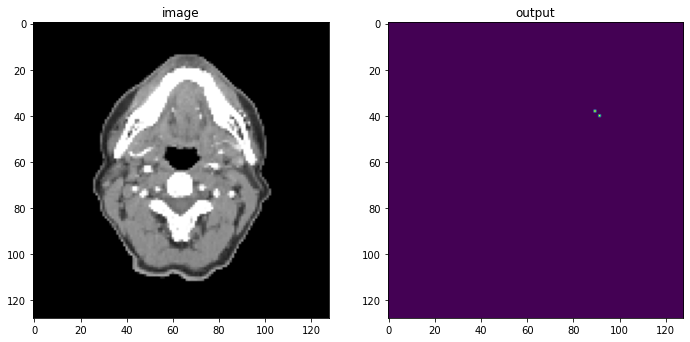

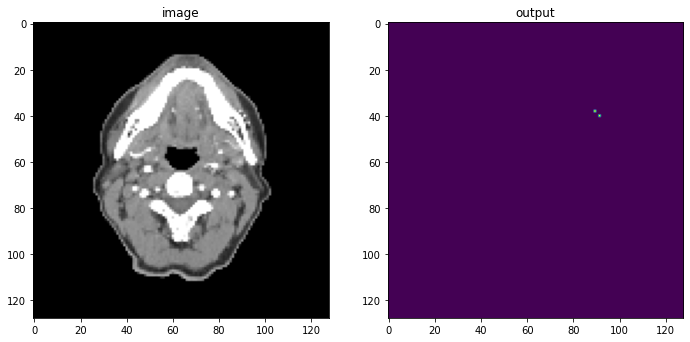

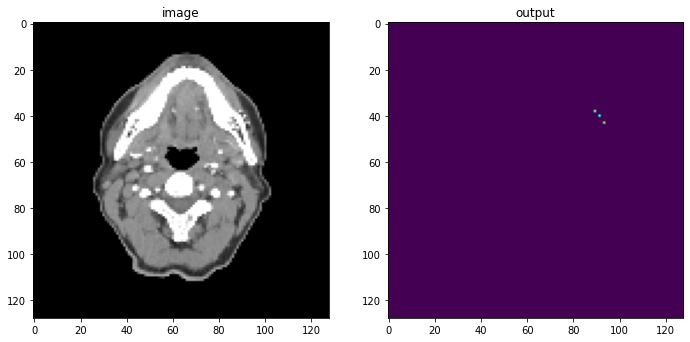

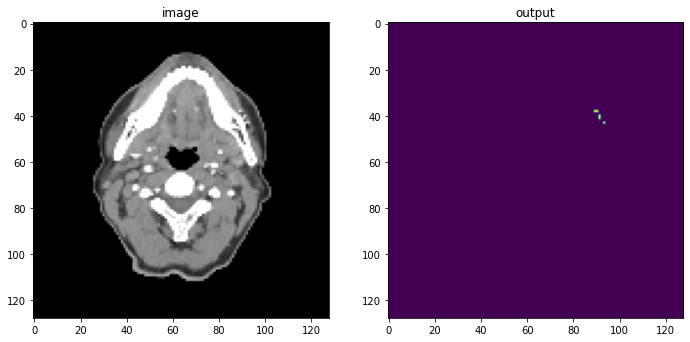

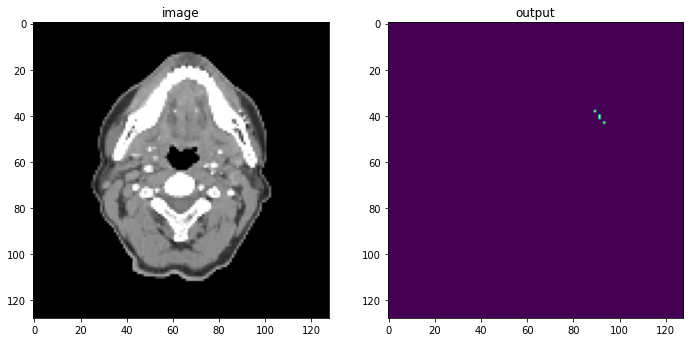

...

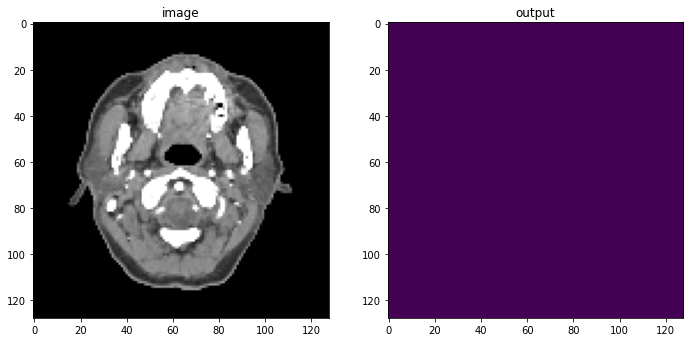

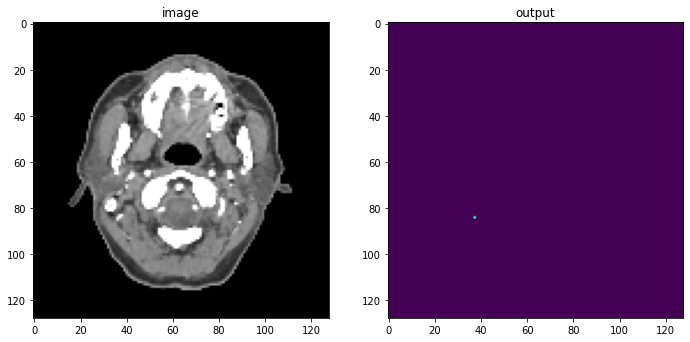

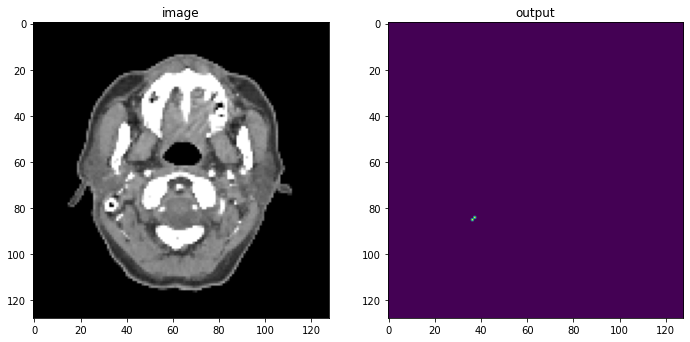

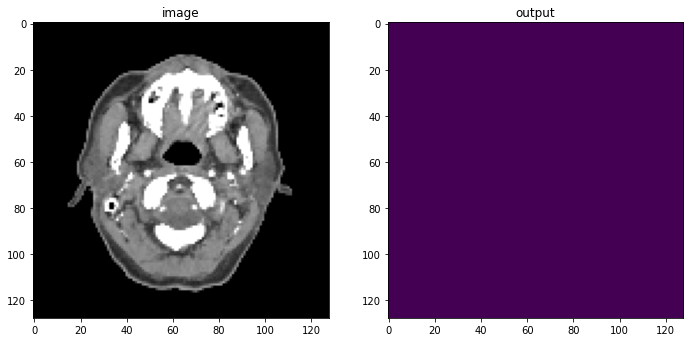

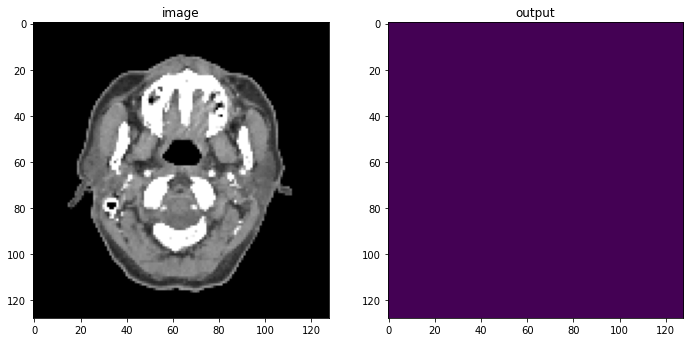

In [25]:
# Predict with fixed angle
import scipy.ndimage as ndimage

angle = 270 # in degrees

case_num = 4  # 4, 6

with torch.no_grad():
    data = test_ds[case_num]
    img = test_ds[case_num]["image"]
    test_inputs = torch.unsqueeze(img, 1).cuda()
    test_outputs = sliding_window_inference(
        test_inputs, INPUT_SIZE, 4, model, overlap=0.8
    )

    output_data = torch.argmax(test_outputs, dim=1).detach().cpu()
    
    for i in range(0, 64):
        plt.figure("check", (18, 6))
        plt.subplot(1, 3, 1)
        plt.title("image")
        input_data = test_inputs.cpu().numpy()[0, 0, :, :, i]
        plt.imshow(ndimage.rotate(input_data, angle, reshape=True), cmap="gray")
        plt.subplot(1, 3, 2)
        plt.title("output")
        output_image = output_data[0, :, :, i]
        
        plt.imshow(
            ndimage.rotate(output_image, angle, reshape=True)
        )
        plt.show()

In [28]:
# Check label count

pred_data = torch.argmax(test_outputs, dim=1).detach().cpu()
print(np.unique(pred_data, return_counts=True))

(array([0, 2]), array([1048526,      50]))


# Resizing to 512x512 from 128x128

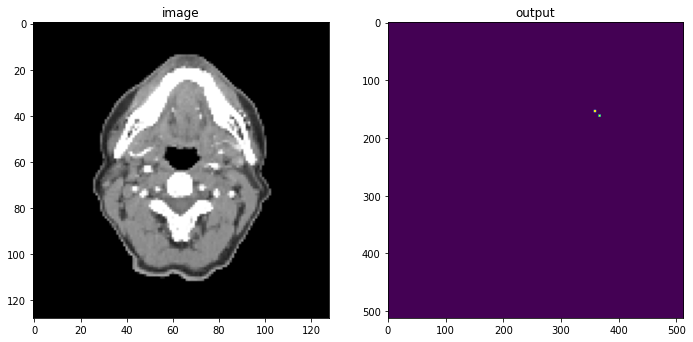

(array([0, 2]), array([262112,     32]))


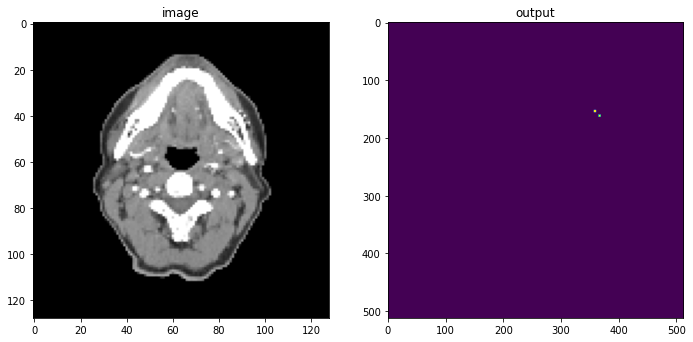

(array([0, 2]), array([262112,     32]))


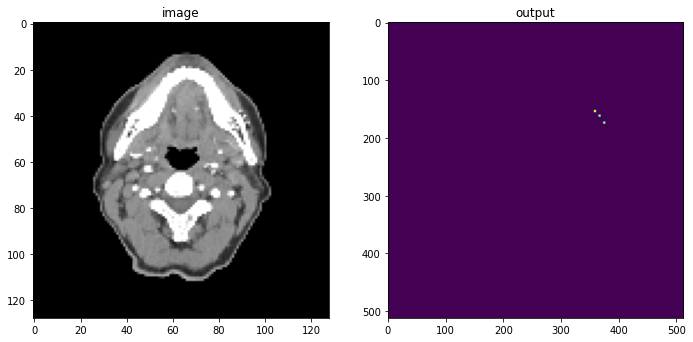

(array([0, 2]), array([262096,     48]))


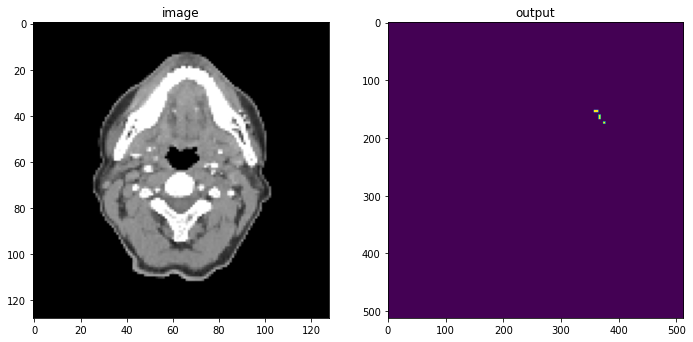

(array([0, 2]), array([262064,     80]))


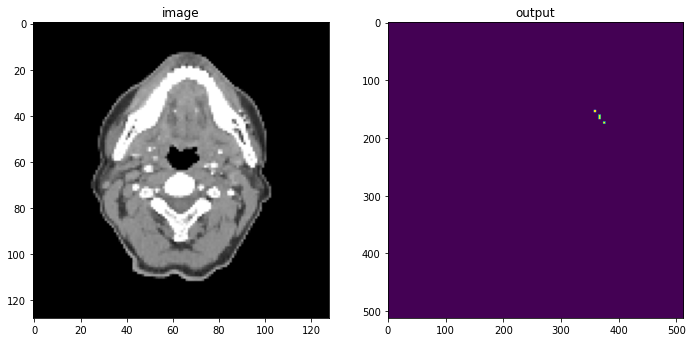

(array([0, 2]), array([262080,     64]))


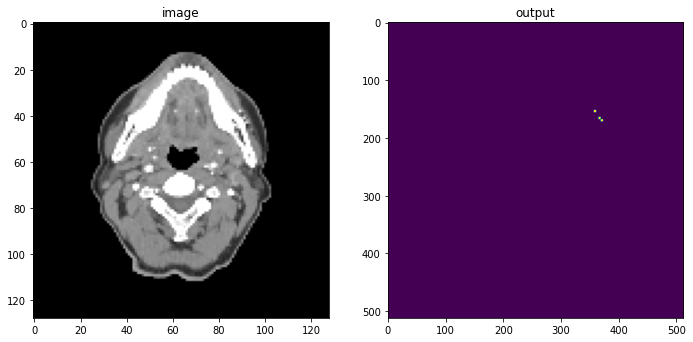

(array([0, 2]), array([262096,     48]))


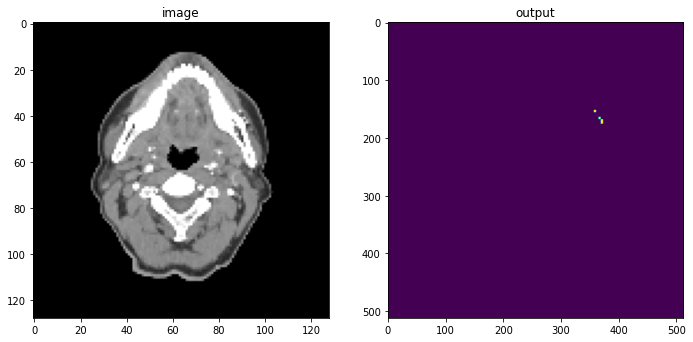

(array([0, 2]), array([262080,     64]))


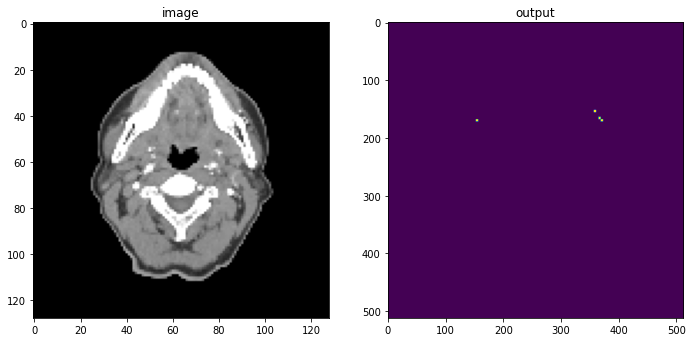

(array([0, 2]), array([262080,     64]))


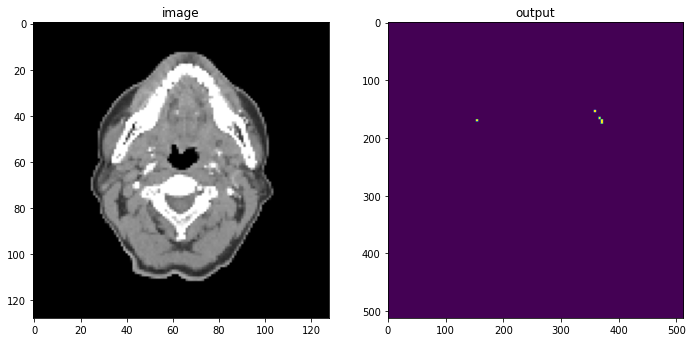

(array([0, 2]), array([262064,     80]))


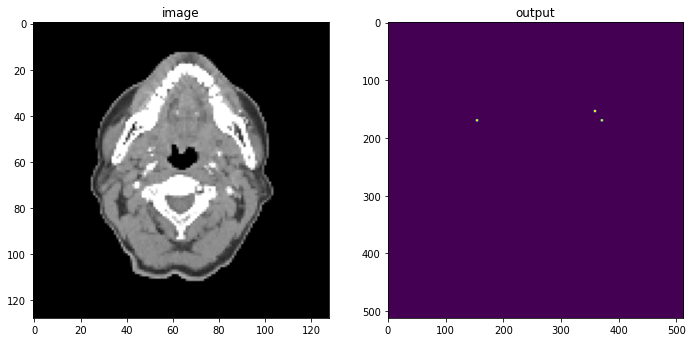

(array([0, 2]), array([262096,     48]))


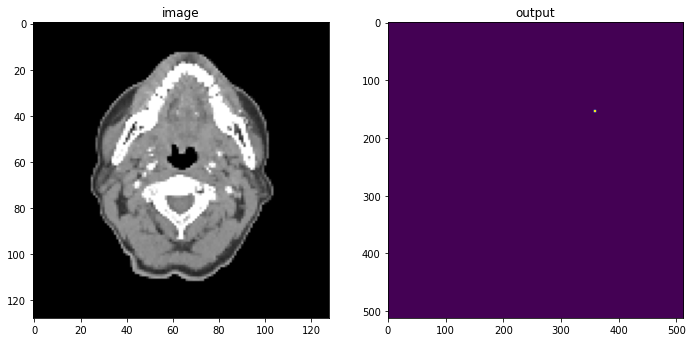

(array([0, 2]), array([262128,     16]))


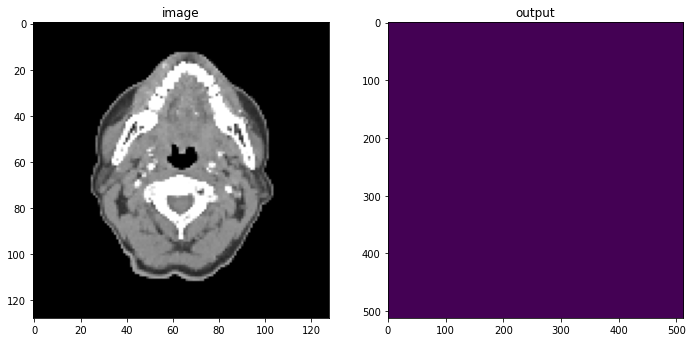

(array([0]), array([262144]))


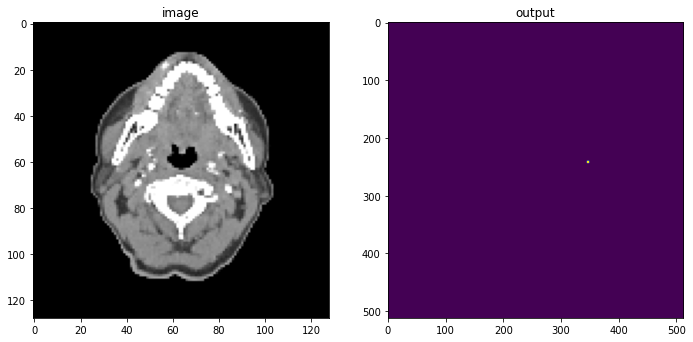

(array([0, 2]), array([262128,     16]))


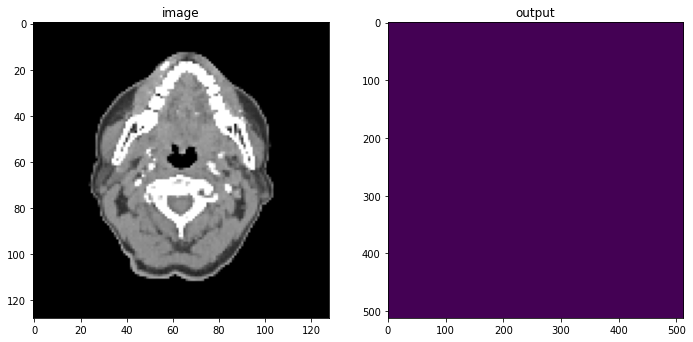

(array([0]), array([262144]))


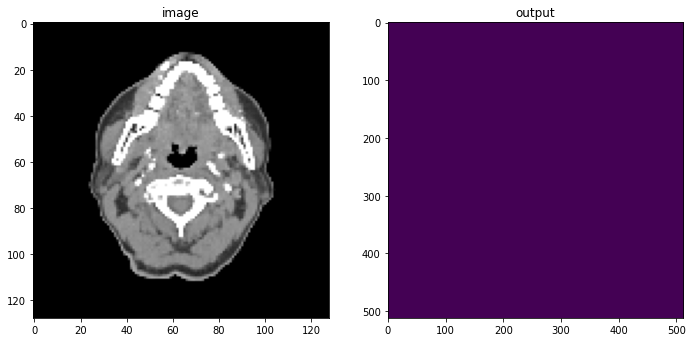

(array([0]), array([262144]))


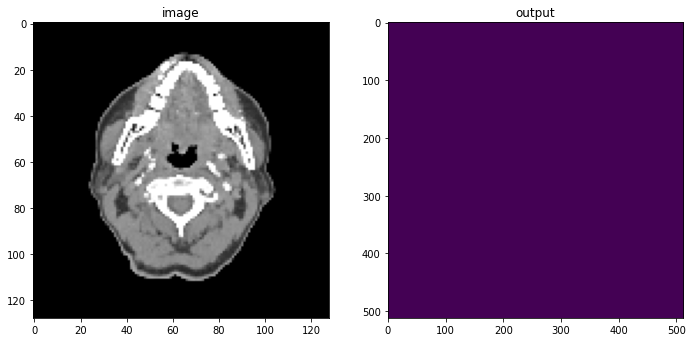

(array([0]), array([262144]))


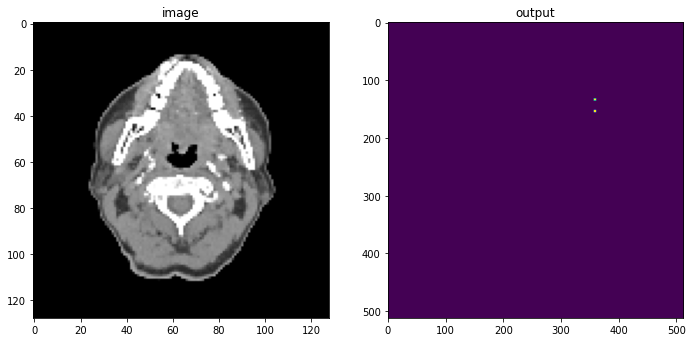

(array([0, 2]), array([262112,     32]))


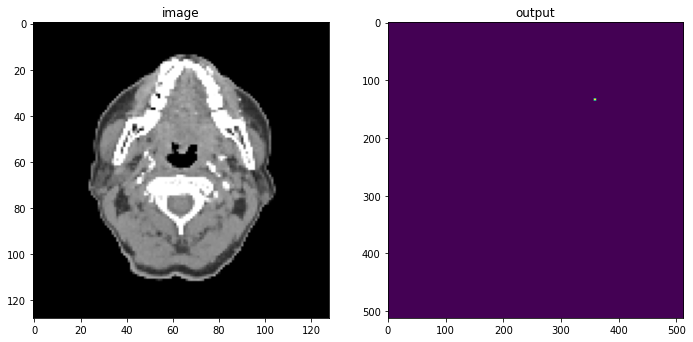

(array([0, 2]), array([262128,     16]))


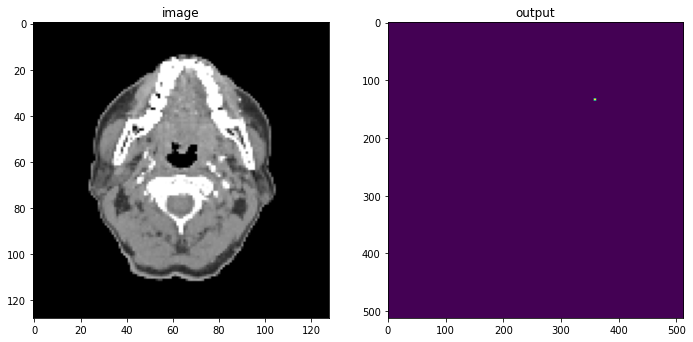

(array([0, 2]), array([262128,     16]))


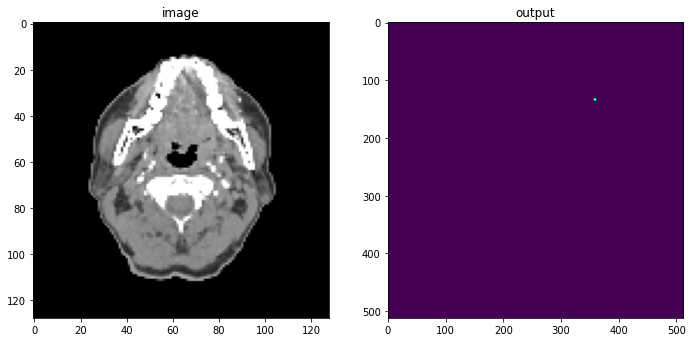

(array([0, 2]), array([262128,     16]))


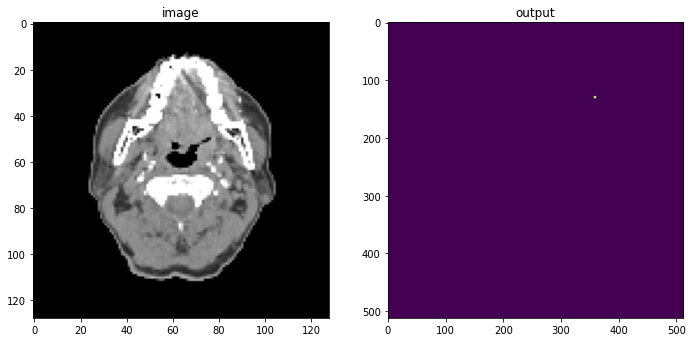

(array([0, 2]), array([262128,     16]))


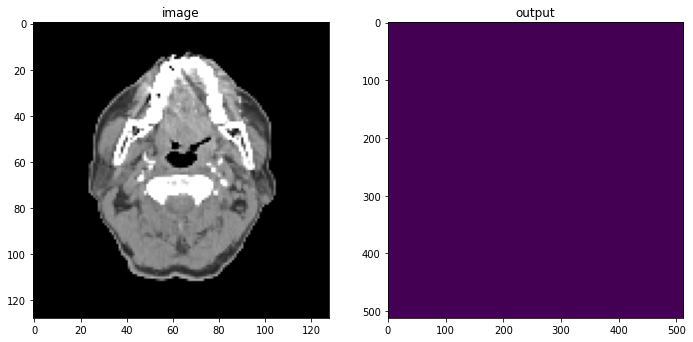

(array([0]), array([262144]))


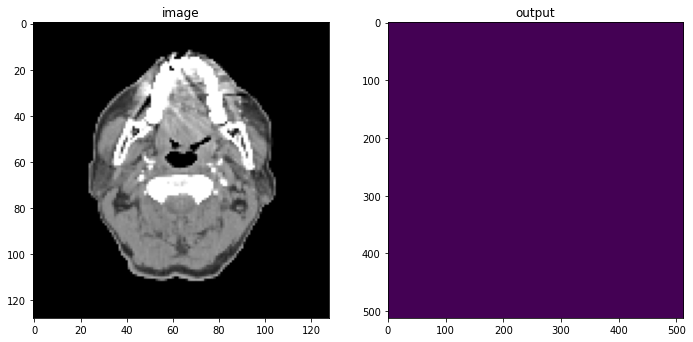

(array([0]), array([262144]))


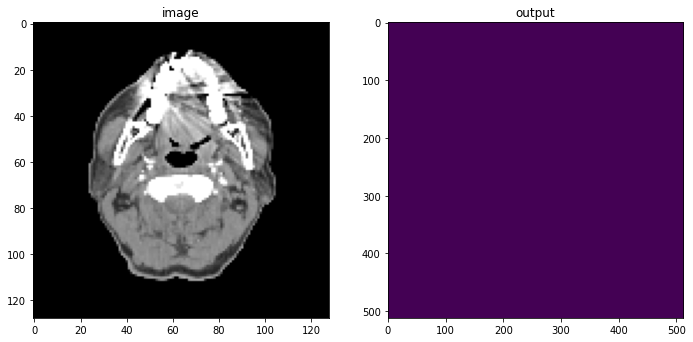

(array([0]), array([262144]))


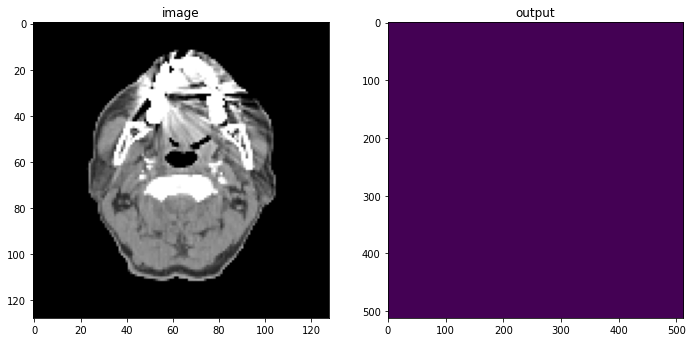

(array([0]), array([262144]))


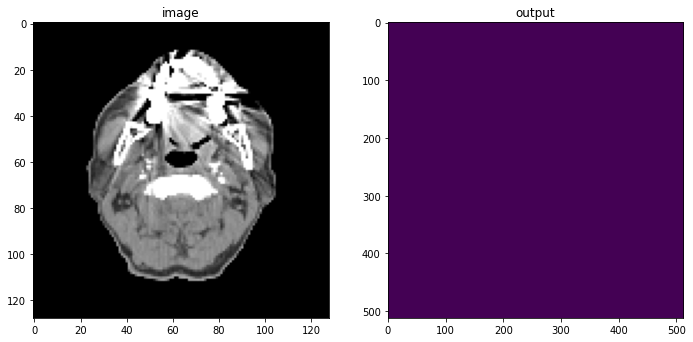

(array([0]), array([262144]))


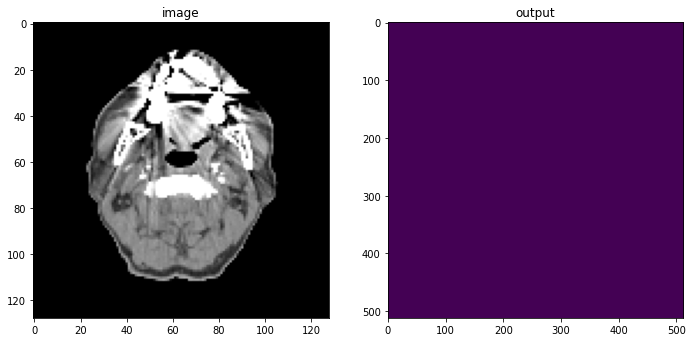

(array([0]), array([262144]))


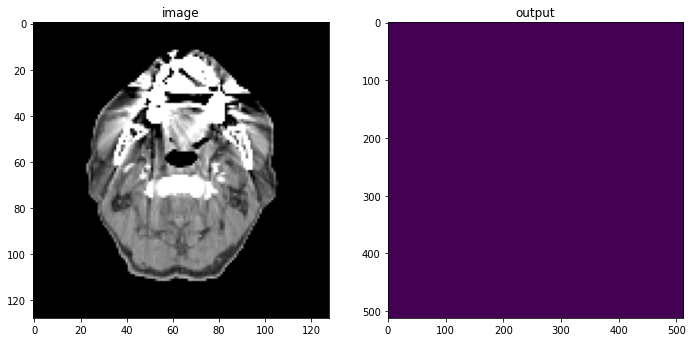

(array([0]), array([262144]))


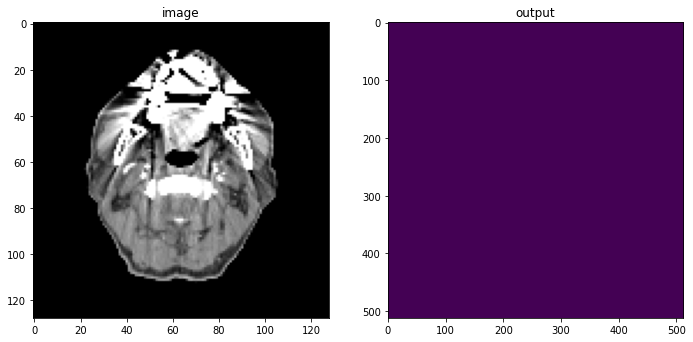

(array([0]), array([262144]))


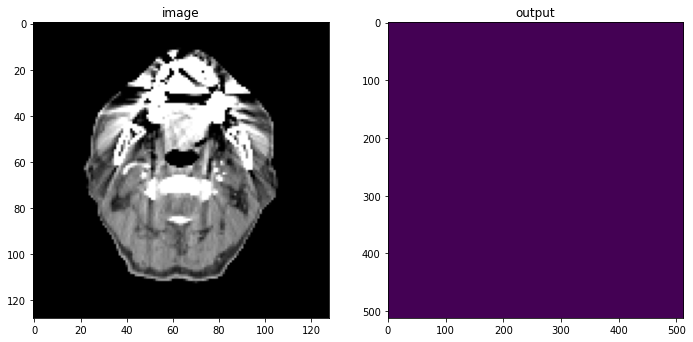

(array([0]), array([262144]))


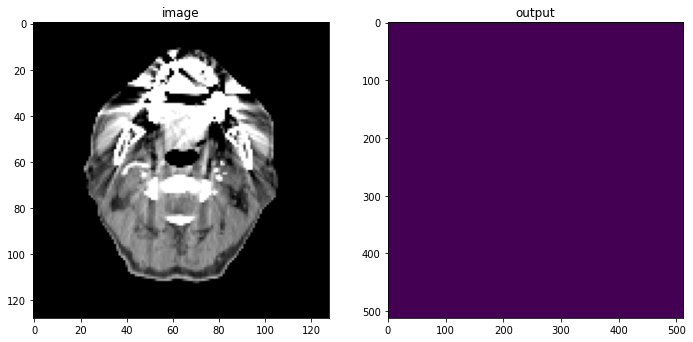

(array([0]), array([262144]))


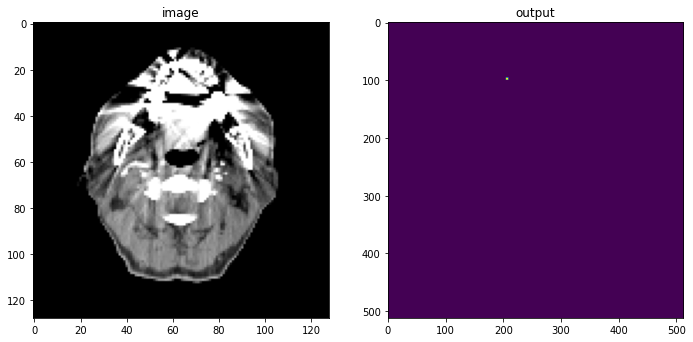

(array([0, 2]), array([262128,     16]))


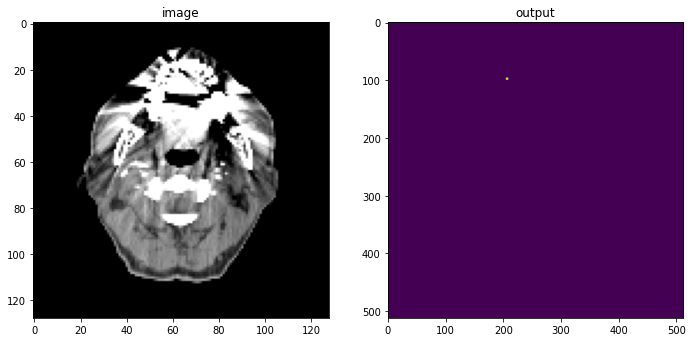

(array([0, 2]), array([262128,     16]))


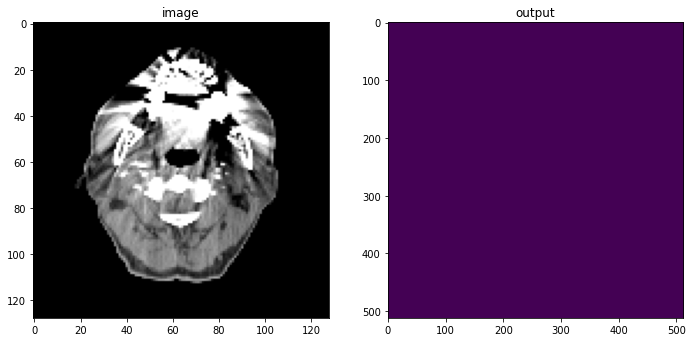

(array([0]), array([262144]))


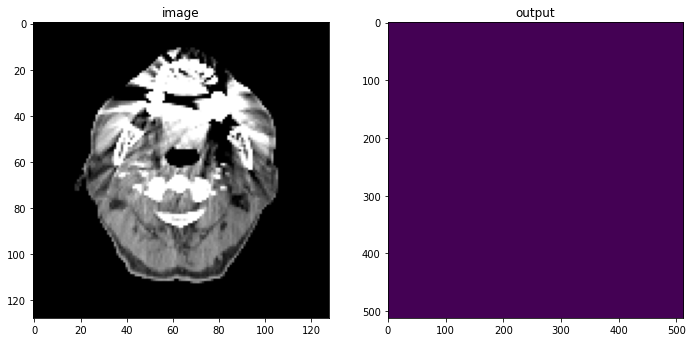

(array([0]), array([262144]))


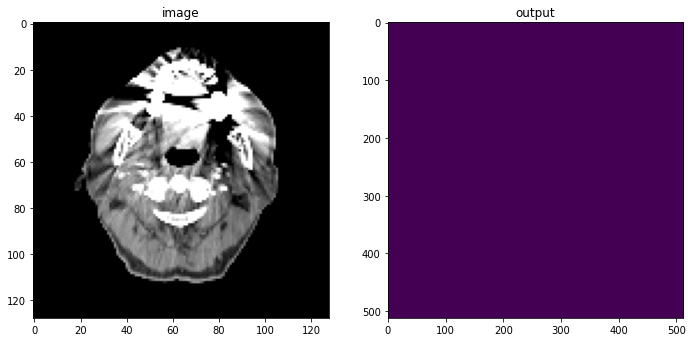

(array([0]), array([262144]))


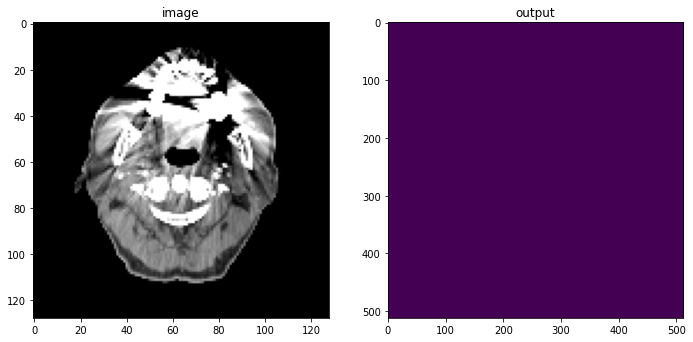

(array([0]), array([262144]))


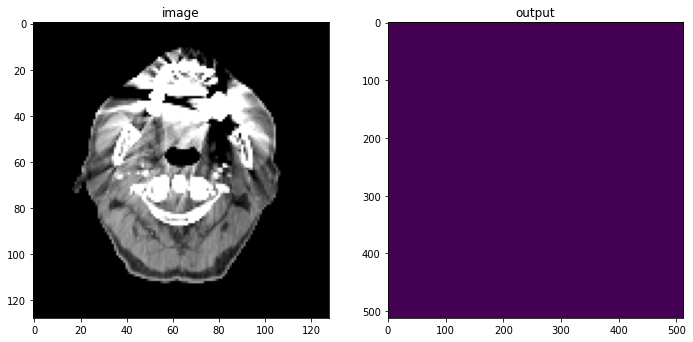

(array([0]), array([262144]))


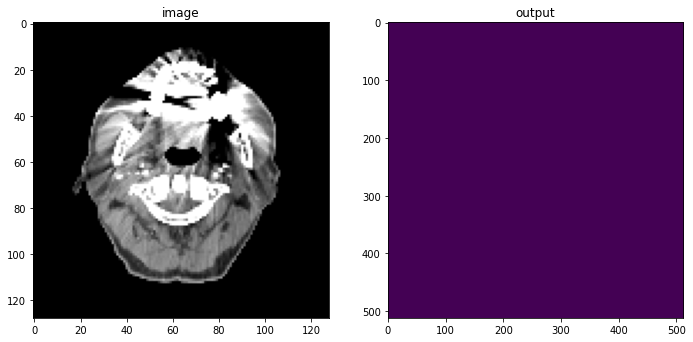

(array([0]), array([262144]))


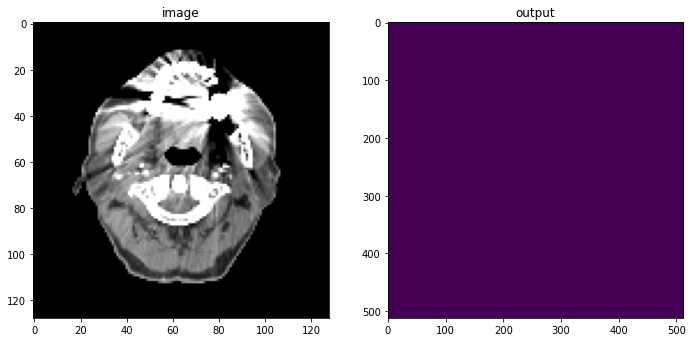

(array([0]), array([262144]))


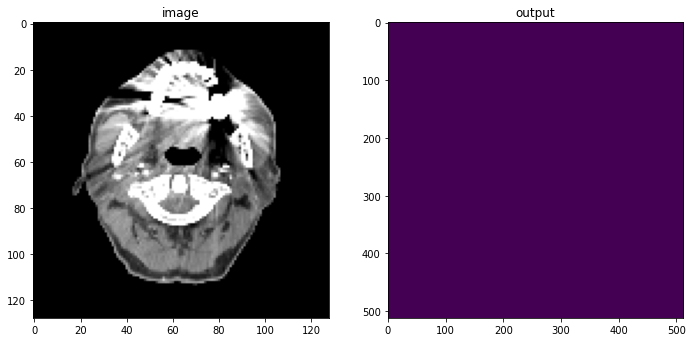

(array([0]), array([262144]))


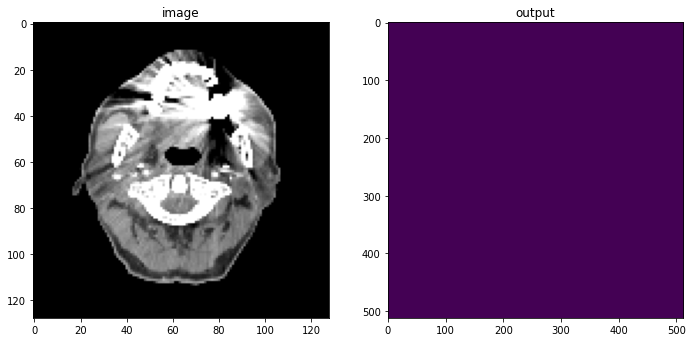

(array([0]), array([262144]))


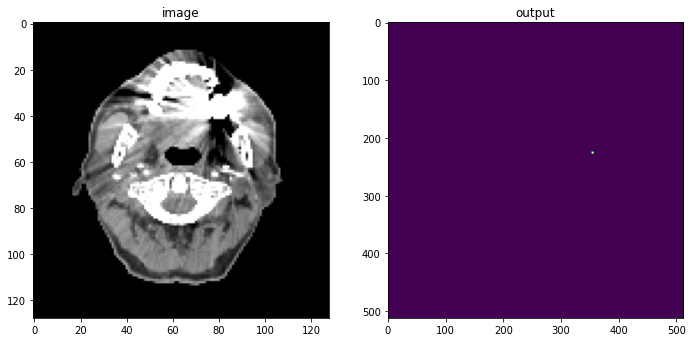

(array([0, 2]), array([262128,     16]))


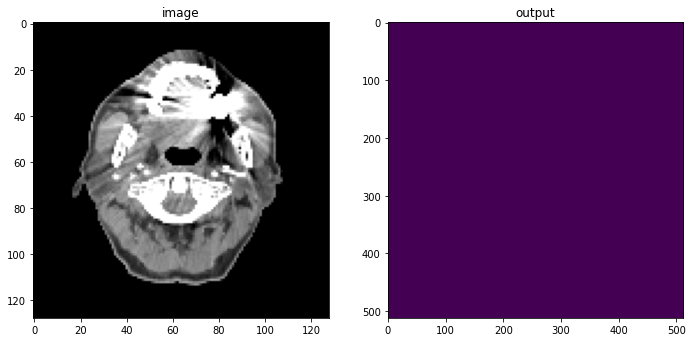

(array([0]), array([262144]))


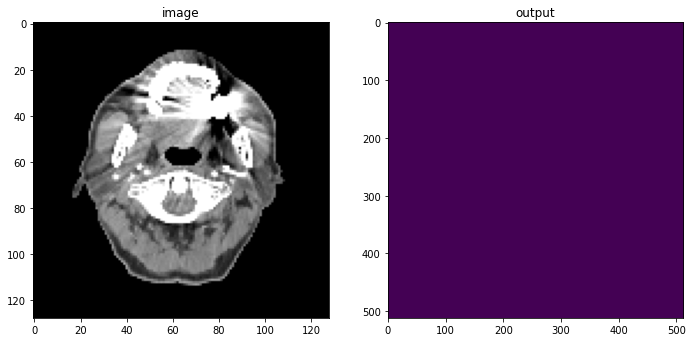

(array([0]), array([262144]))


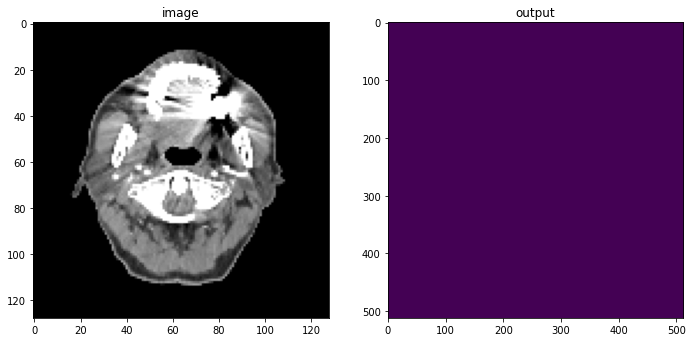

(array([0]), array([262144]))


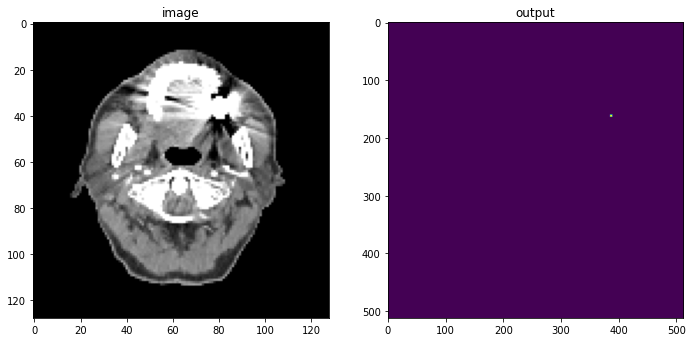

(array([0, 2]), array([262128,     16]))


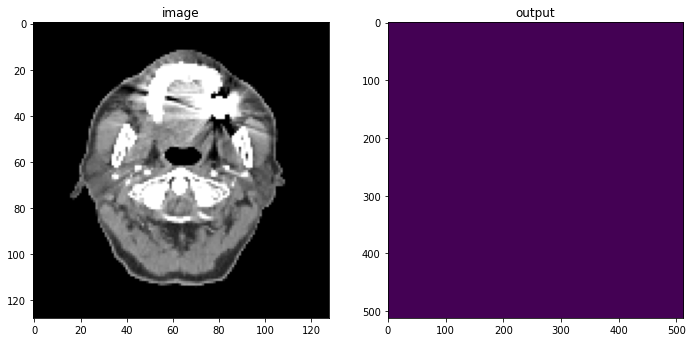

(array([0]), array([262144]))


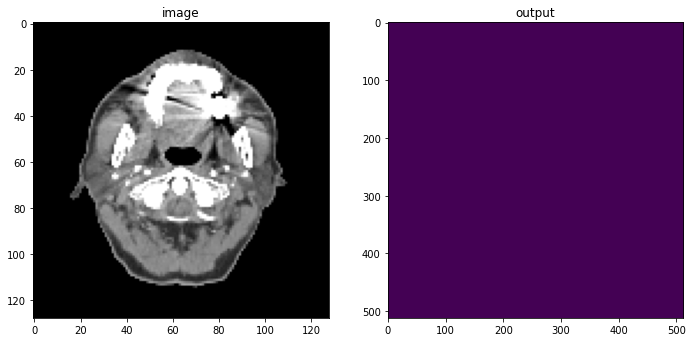

(array([0]), array([262144]))


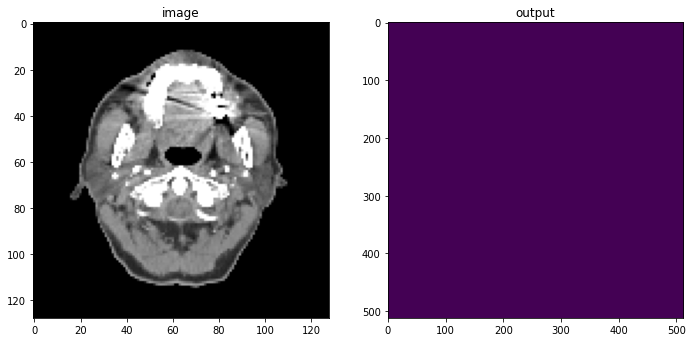

(array([0]), array([262144]))


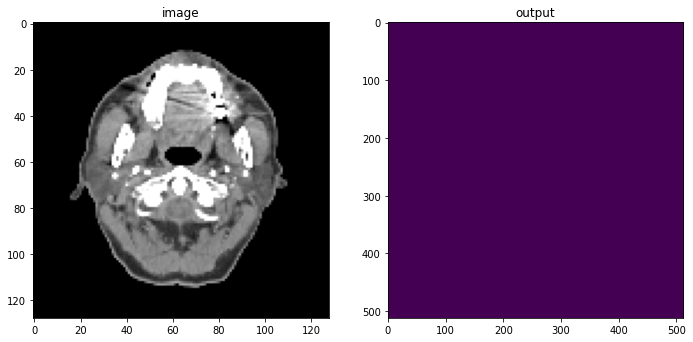

(array([0]), array([262144]))


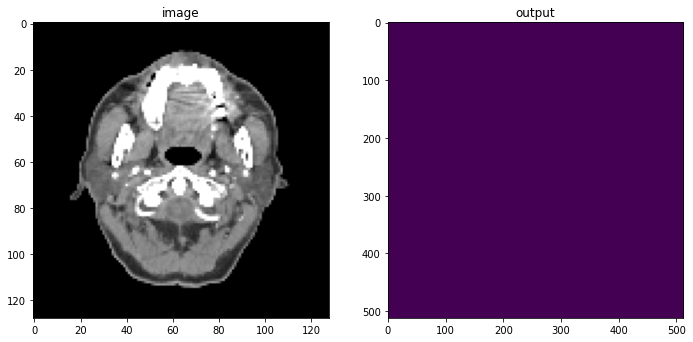

(array([0]), array([262144]))


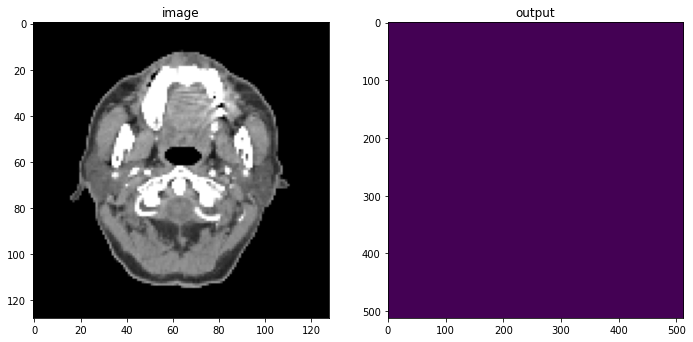

(array([0]), array([262144]))


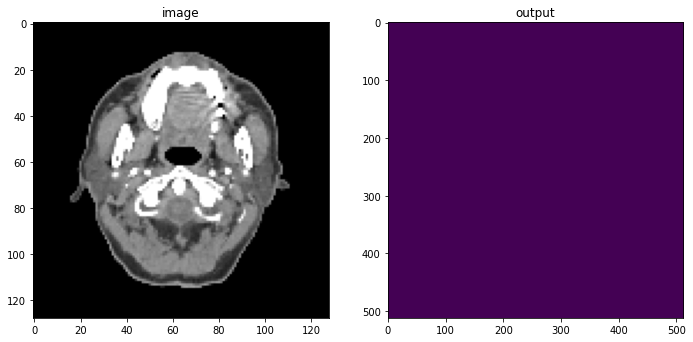

(array([0]), array([262144]))


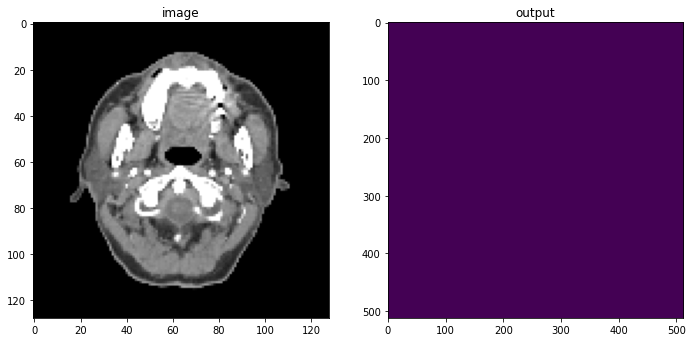

(array([0]), array([262144]))


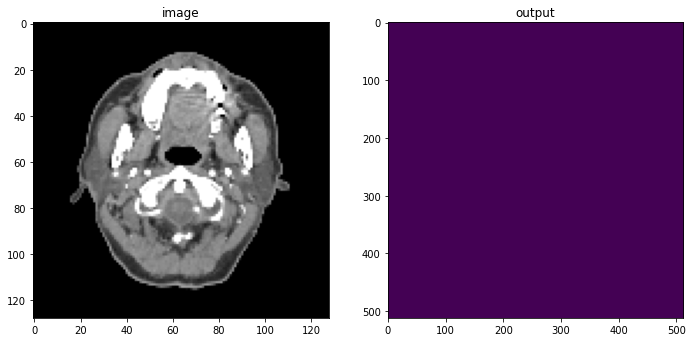

(array([0]), array([262144]))


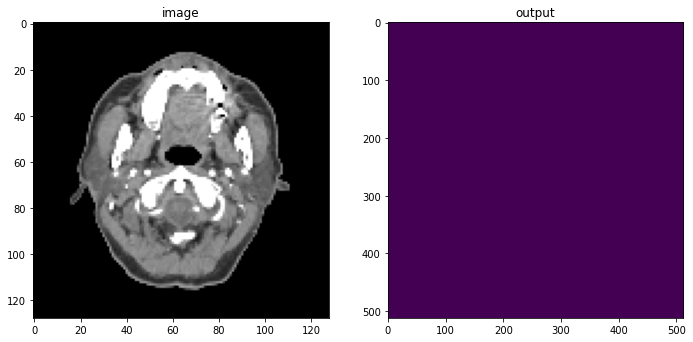

(array([0]), array([262144]))


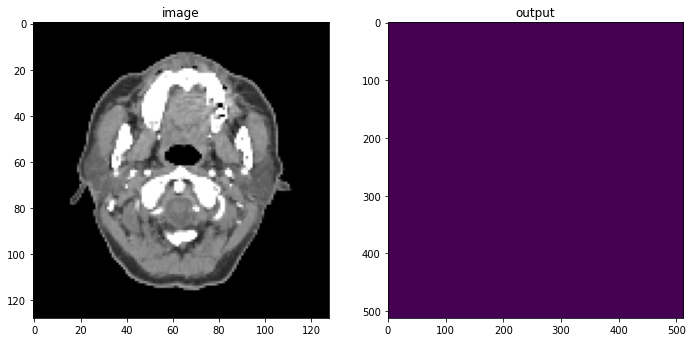

(array([0]), array([262144]))


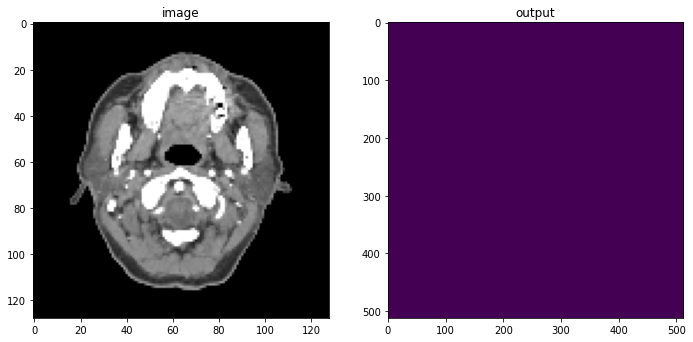

(array([0]), array([262144]))


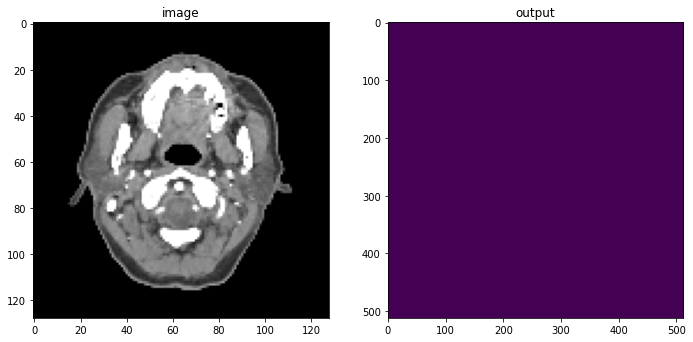

(array([0]), array([262144]))


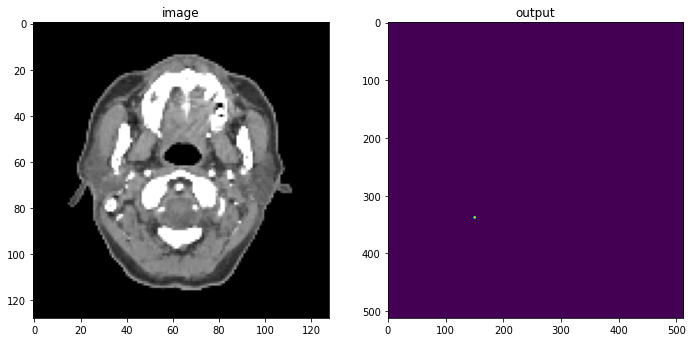

(array([0, 2]), array([262128,     16]))


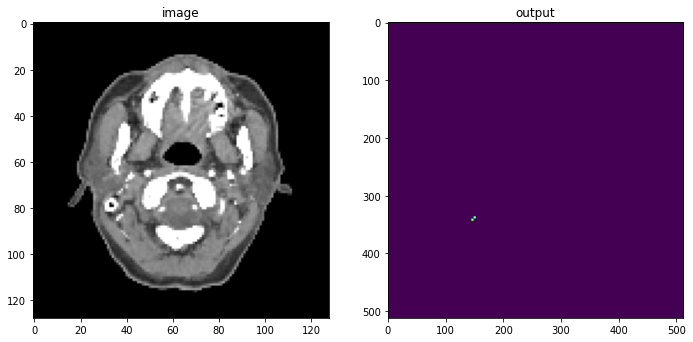

(array([0, 2]), array([262112,     32]))


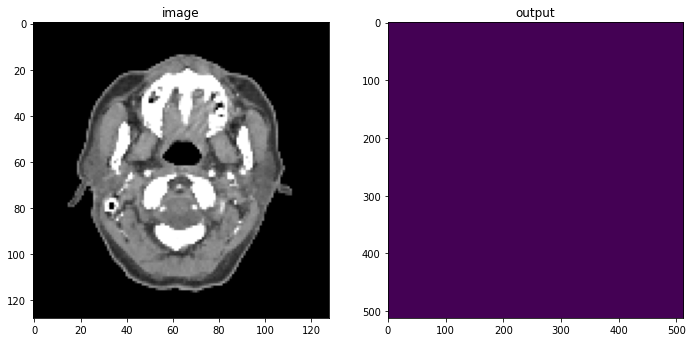

(array([0]), array([262144]))


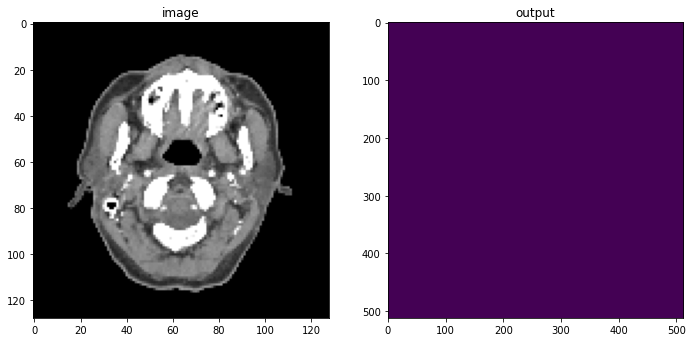

(array([0]), array([262144]))


In [32]:
# Predict with fresize

import scipy.ndimage as ndimage
from skimage.transform import resize

angle = 270 # in degrees

case_num = 4  # 4, 6

with torch.no_grad():
    data = test_ds[case_num]
    img = test_ds[case_num]["image"]
    test_inputs = torch.unsqueeze(img, 1).cuda()
    test_outputs = sliding_window_inference(
        test_inputs, INPUT_SIZE, 4, model, overlap=0.8
    )

    output_data = torch.argmax(test_outputs, dim=1).detach().cpu()
    output_resized = resize(output_data, (1,512,512,64), anti_aliasing=False, order=0)
    
#     for i in range(0, 64):
#         plt.figure("check", (18, 6))
#         plt.subplot(1, 3, 1)
#         plt.title("image")
#         input_data = test_inputs.cpu().numpy()[0, 0, :, :, i]
#         plt.imshow(ndimage.rotate(input_data, angle, reshape=True), cmap="gray")
#         plt.subplot(1, 3, 2)
#         plt.title("output")
#         output_image = output_resized[0, :, :, i]
#         plt.imshow(
#             ndimage.rotate(output_image, angle, reshape=True)
#         )
#         plt.show()
#         print(np.unique(output_image, return_counts=True))

In [33]:
# Label count in 128x128
print(np.unique(output_resized, return_counts=True))

(array([0, 2]), array([16776416,      800]))


In [34]:
# Label count in 512x512
print(np.unique(output_data, return_counts=True))

(array([0, 2]), array([1048526,      50]))


# Save as nifti

In [35]:
data = output_resized
data_array = np.array(data, dtype=np.float32)
print(data_array.shape)

(1, 512, 512, 64)


In [36]:
data_reshaped = data_array.transpose(1,2,3,0)
print(data_reshaped.shape)

(512, 512, 64, 1)


In [37]:
data_flip = np.flip(data_reshaped, axis=1)

In [38]:
import nibabel as nib
img = nib.Nifti1Image(data_flip, np.eye(4))

In [41]:
nib.save(img, './monai_data_directory/unetr/results/128x128x64/output.nii.gz')

# Save as nrrd

In [42]:
data = output_resized
data_array = np.array(data, dtype=np.float32)
print(data_array.shape)

(1, 512, 512, 64)


In [43]:
data_reshaped = data_array.transpose(1,2,3,0)
print(data_reshaped.shape)

(512, 512, 64, 1)


In [44]:
#data_flip = np.flip(data_reshaped, axis=0)
data_flip = np.flip(data_reshaped, axis=1)

In [45]:
import nrrd

In [46]:
nrrd.write('./monai_data_directory/unetr/results/128x128x64/output.nrrd', data_flip)

# Whole volume prediction
Predict for groups of one patient and then combine them back to one volume.

In [47]:
import scipy.ndimage as ndimage
from skimage.transform import resize

In [48]:
angle = 270

In [49]:
test_transforms = Compose(
    [
        LoadImaged(keys=["image"]),
        AddChanneld(keys=["image"]),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(
            keys=["image"],
            pixdim=(1.0, 1.0, 1.0),
            mode=("bilinear"),
        ),
        ScaleIntensityRanged(
            keys=["image"], a_min=-175, a_max=250, b_min=0.0, b_max=1.0, clip=True
        ),
        CropForegroundd(keys=["image"], source_key="image"),
        Resized(keys=['image'], spatial_size=INPUT_SIZE, mode='nearest-exact'),
        ToTensord(keys=["image"]),
    ]
)

In [50]:
test_path = '/media/trojan/evo/3D-CT-Artery-Segmentation/data/data_128x128x64/data_test/data_patients'
test_patients = sorted(glob.glob(test_path + '/*'))

In [51]:
image = []
#for patient in test_patients:
patient = test_patients[1]
test_image_list = sorted(glob.glob(patient + '/*.nii.gz'))
test_files = [{'image': image_name} for image_name in test_image_list]
test_ds = CacheDataset(data=test_files, transform=test_transforms, cache_num=10, cache_rate=1.0)
test_loader = DataLoader(test_ds, batch_size=1, shuffle=False, pin_memory=True)

with torch.no_grad():
    for case_num in range(len(test_image_list)):
        data = test_ds[case_num]
        img = test_ds[case_num]["image"]
        test_inputs = torch.unsqueeze(img, 1).cuda()
        test_outputs = sliding_window_inference(
            test_inputs, (128, 128, 64), 4, model, overlap=0.8
        )

        output_data = torch.argmax(test_outputs, dim=1).detach().cpu()
        output_resized = resize(output_data, (1,512,512,64), anti_aliasing=False, order=0)

#             for i in range(0, 64):
#                 plt.figure("check", (18, 6))
#                 plt.subplot(1, 3, 1)
#                 plt.title("image")
#                 input_data = test_inputs.cpu().numpy()[0, 0, :, :, i]
#                 plt.imshow(ndimage.rotate(input_data, angle, reshape=True), cmap="gray")
#                 plt.subplot(1, 3, 2)
#                 plt.title("output")
#                 output_image = output_resized[0, :, :, i]
#                 plt.imshow(
#                     ndimage.rotate(output_image, angle, reshape=True)
#                 )
#                 plt.show() 

        data = output_resized
        data_array = np.array(data, dtype=np.float32)
        #data_reshaped = data_array.transpose(1,2,3,0)
        data_flip = np.flip(data_array, axis=1)
        image.append(data_flip)

Loading dataset: 100%|████████████████████████████| 8/8 [00:00<00:00, 33.97it/s]


In [52]:
image = np.array(image)
print(image.shape)

(8, 1, 512, 512, 64)


In [54]:
# Save groups as nrrd
import nrrd
for i in range(image.shape[0]):
    print(np.unique(image[i,0,:,:,:], return_counts=True))
        nrrd.write(f'./monai_data_directory/unetr/results/128x128x64/{idx+1}/output_groups/{i}.nrrd', image[i,0,:,:,:])

(array([0.], dtype=float32), array([16777216]))
(array([0., 1.], dtype=float32), array([16777104,      112]))
(array([0.], dtype=float32), array([16777216]))
(array([0., 2.], dtype=float32), array([16776848,      368]))
(array([0., 2.], dtype=float32), array([16774144,     3072]))
(array([0., 2.], dtype=float32), array([16776608,      608]))
(array([0., 1.], dtype=float32), array([16775824,     1392]))
(array([0., 1.], dtype=float32), array([16774928,     2288]))


In [57]:
temp = np.array(image)

In [58]:
# Save as one volume
arr = np.empty((512,512,0))
for i in range(0, temp.shape[0], 1):
    arr1 = np.array(temp[i,0,:,:,:])
    arr = np.concatenate((arr,arr1), axis=2)

In [59]:
print(arr.shape)
print(np.unique(arr, return_counts=True))

(512, 512, 512)
(array([0., 1., 2.]), array([134209888,      3792,      4048]))


In [60]:
arr = np.flip(arr, axis=1)

In [61]:
nrrd.write(f'./monai_data_directory/unetr/results/128x128x64/{idx+1}/output_whole/output_whole.nrrd', arr)